In [ ]:
import sys
sys.path.append("..")

from src.clonality import run_clonality_analysis
from src.dataset_loader import load_dataset

import scanpy as sc
import matplotlib
from matplotlib import rcParams

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, dpi_save=300, color_map='Reds', facecolor='white')
matplotlib.rcParams.update({'figure.figsize': (6, 6)})

# adata_d4 = load_dataset("hemo_larry_d4")
# adata_d7 = load_dataset("hemo_larry_d7")
# adata_d4_endo = load_dataset("hemo_larry_d4_endo")
# adata_d12 = load_dataset("hemo_larry_d12")
# adata_10 = load_dataset("hemo_bgi")
# adata_peri = load_dataset("perigas_bgi")
# adata_perigas_endo = load_dataset("perigas_endo")
# adata_hypo = load_dataset("embryotree_hypo")
# adata_embryo = load_dataset("embryotree")
# adata_32 = load_dataset('hemo_d1_32_scvi')

In [13]:
%config InlineBackend.figure_format = 'retina'

### HCEB D1-10

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(12, 5), gridspec_kw={'width_ratios': [1, 1, 0.1]})

# Counts
celltype_counts = pd.crosstab(adata.obs['sample'], adata.obs['CellType_man'])
celltype_counts.plot(kind='bar', stacked=True, ax=axes[0], legend=False, grid=False)
axes[0].set_title('Cell Type Counts by Sample')
axes[0].set_ylabel('Cell Count')
axes[0].tick_params(axis='x', rotation=45)

# Proportions
celltype_props = celltype_counts.div(celltype_counts.sum(axis=1), axis=0) * 100
celltype_props.plot(kind='bar', stacked=True, ax=axes[1], legend=False, grid=False)
axes[1].set_title('Cell Type Proportions by Sample')
axes[1].set_ylabel('Percentage (%)')
axes[1].tick_params(axis='x', rotation=45)

# Legend
handles, labels = axes[0].get_legend_handles_labels()
axes[2].axis('off')
axes[2].legend(handles, labels, title='Cell Types', loc='center', frameon=False)

plt.tight_layout()
plt.savefig('/mnt/yiming/nfs_share/hema_wave/2512-revision/2_hemo10_barplot_cellprop.svg', 
            format='svg', dpi=300, bbox_inches='tight')
plt.show()
plt.close()

In [ ]:
# Define genes
genes = ['HBZ', 'HBE1', 'HBG1', 'GYPA']
colors = ['#E41A1C', '#377EB8', '#4DAF4A', '#984EA3']

# Define genes
genes = ['SOX17', 'GATA6', 'FOXA2', 'CDX2']
colors = ['#E41A1C', '#377EB8', '#4DAF4A', '#984EA3']

# Create figure
fig, ax = plt.subplots(figsize=(6, 3))

# Plot each gene
for gene, color in zip(genes, colors):
    if gene in adata_endo.var_names:
        # Get expression data
        expr = adata_endo[:, gene].X
        if hasattr(expr, 'toarray'):
            expr = expr.toarray().flatten()
        else:
            expr = expr.flatten()
        
        time_points = adata_endo.obs['day'].values
        
        # Calculate mean expression per time point
        unique_times = np.unique(time_points)
        mean_expr = []
        mean_time = []
        
        for t in unique_times:
            mask = time_points == t
            if np.sum(mask) > 0:
                mean_expr.append(np.mean(expr[mask]))
                mean_time.append(t)
        
        mean_expr = np.array(mean_expr)
        mean_time = np.array(mean_time)
        
        # Sort by time
        sort_idx = np.argsort(mean_time)
        mean_time_sorted = mean_time[sort_idx]
        mean_expr_sorted = mean_expr[sort_idx]
        
        # Apply Gaussian smoothing
        sigma = 1.0
        expr_smoothed = gaussian_filter1d(mean_expr_sorted, sigma=sigma)
        
        # Plot smoothed line
        ax.plot(mean_time_sorted, expr_smoothed, 
                color=color, 
                linewidth=2.5,
                label=gene,
                zorder=2)

# Labels
ax.set_xlabel('Sample day')
ax.set_ylabel('Expression')
ax.set_title('Gene expression of HCEB Endo')

# Grid and legend
ax.grid(True)
ax.legend(frameon=True)

# Set y-axis to start at 0
ax.set_ylim(bottom=0)

# Layout
plt.tight_layout()
plt.savefig(f'/mnt/yiming/nfs_share/hema_wave/2512-revision/2_hemo10_line_endo_erygene-2.svg', 
                format='svg', dpi=300, bbox_inches='tight')
plt.show()
plt.close()

### HCEB D1-10 blood subset

In [ ]:
cell_types_of_interest = ['Endo', 'Nasc.Mes', 'Adv.Mes', 'YS.Mes', 
                             'Mes-Ery', 'HE', 'Blood']
adata_subset = adata[adata.obs['CellType_man'].isin(cell_types_of_interest)].copy()

Starting blood-making trajectory analysis...
Original data: (68498, 18732)
Subset data: (27031, 18732)

Cell type distribution in subset:
CellType_man
Adv.Mes     14631
HE           4488
Blood        2963
YS.Mes       1469
Nasc.Mes     1404
Mes-Ery      1258
Endo          818
Name: count, dtype: int64

1. Preprocessing data...
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
regressing out ['n_counts', 'pct_counts_mt']
    finished (0:00:32)

2. Dimensionality reduction...
computing PCA
    with n_comps=50
    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix

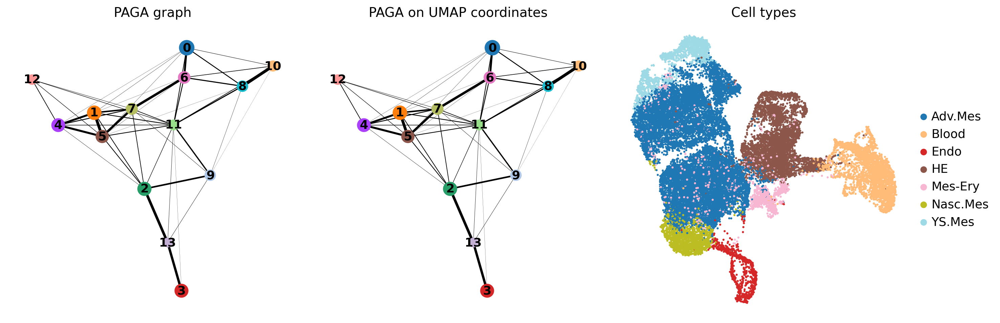


6. Computing Diffusion Pseudotime from Endo...
computing Diffusion Maps using n_comps=10(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9984059  0.997239   0.9942579  0.9918479  0.98688316
     0.986438   0.9858544  0.98328286 0.9828099 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
Selected root cell: CELL296_N3-2
Root cell type: Endo
Root sample: d10
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


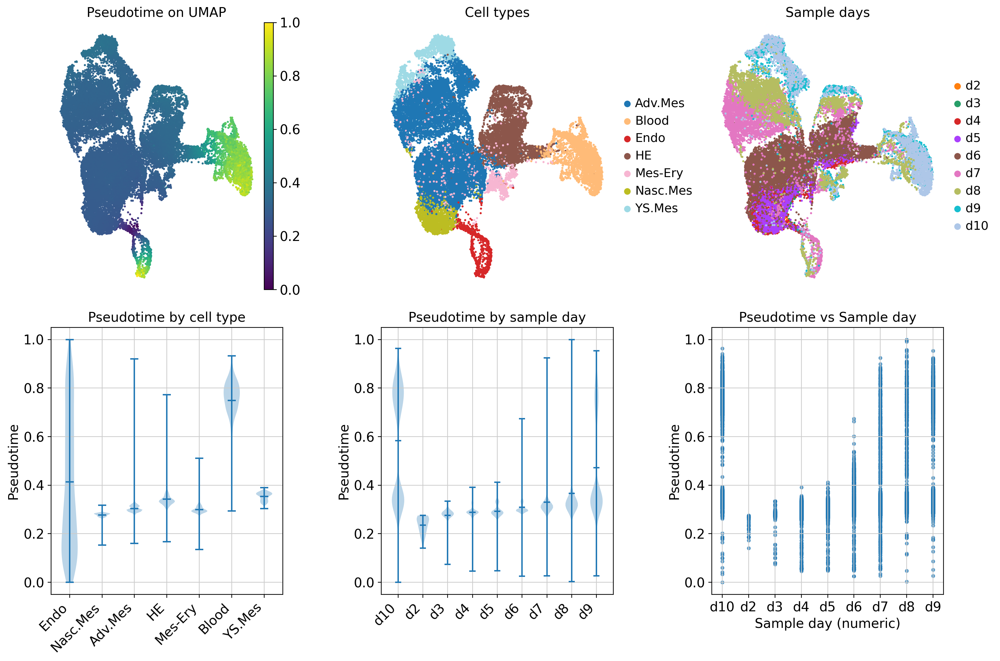


7. Analyzing genes along pseudotime...

Top 30 genes correlated with pseudotime:
             gene  correlation
92         S100A6     0.609757
1277      ARHGDIB     0.570512
93         S100A4     0.566033
1693       PECAM1     0.552843
1249         ESAM     0.528144
1846         CST3     0.507463
1150       IFITM2     0.505912
1915        TIMP3     0.498452
105        CRABP2     0.496344
976          HAS2     0.489326
629           F2R     0.476276
642         MEF2C     0.475814
497           PF4     0.472683
712        POU5F1     0.471090
237         LIMS1     0.469926
1595        CDH11     0.469360
39           TIE1     0.464964
1692        ICAM2     0.457999
1893        U2AF1     0.454953
1159         HBG2     0.450565
695        TUBB2B     0.446250
1186         CD82     0.445939
520         GRID2     0.442758
730   RPS10-NUDT3     0.441492
147         ZBED6     0.440257
827         PSMA2     0.437188
27       SH3BGRL3     0.436737
630         F2RL2     0.436374
1160         HBG1  

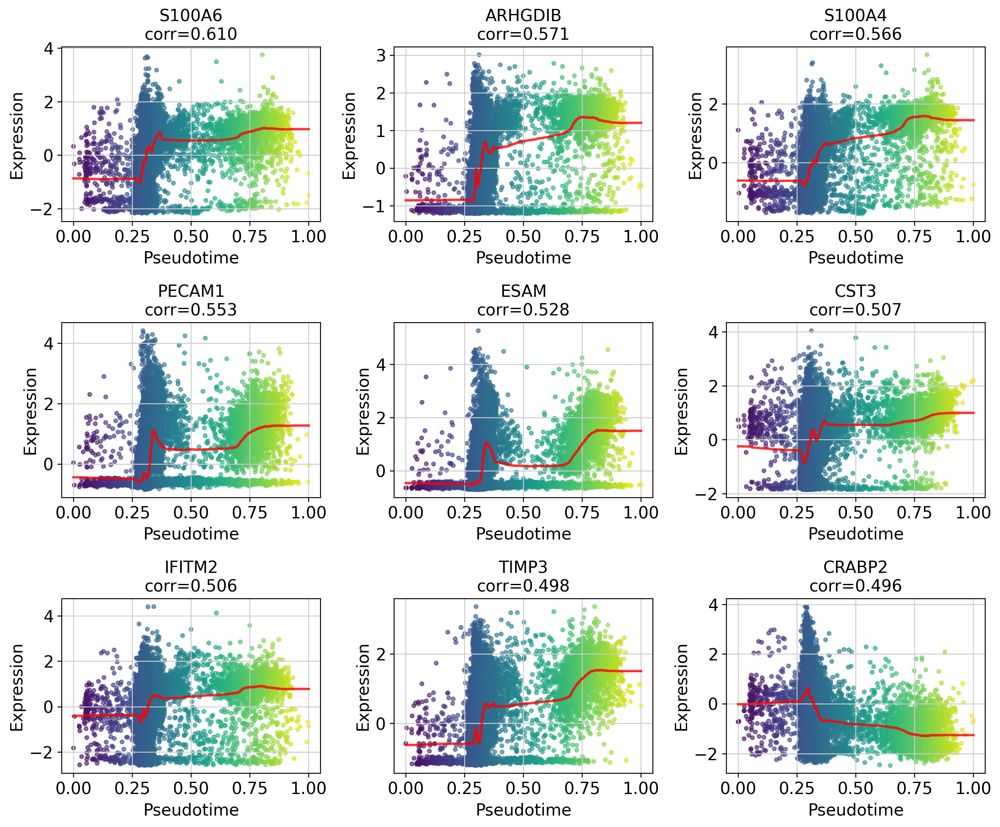


8. Creating trajectory visualizations...


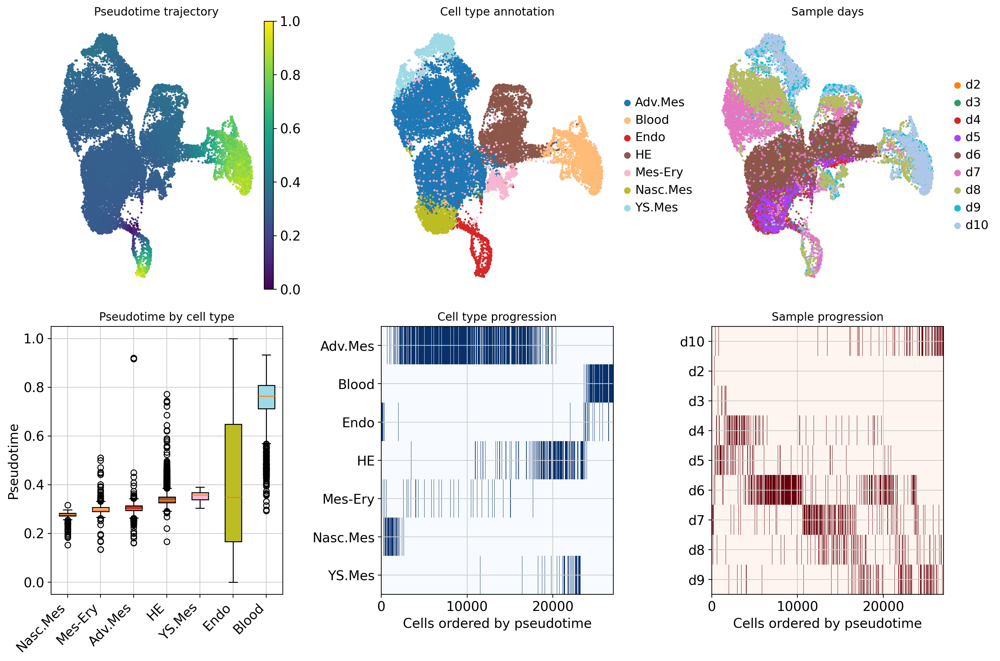

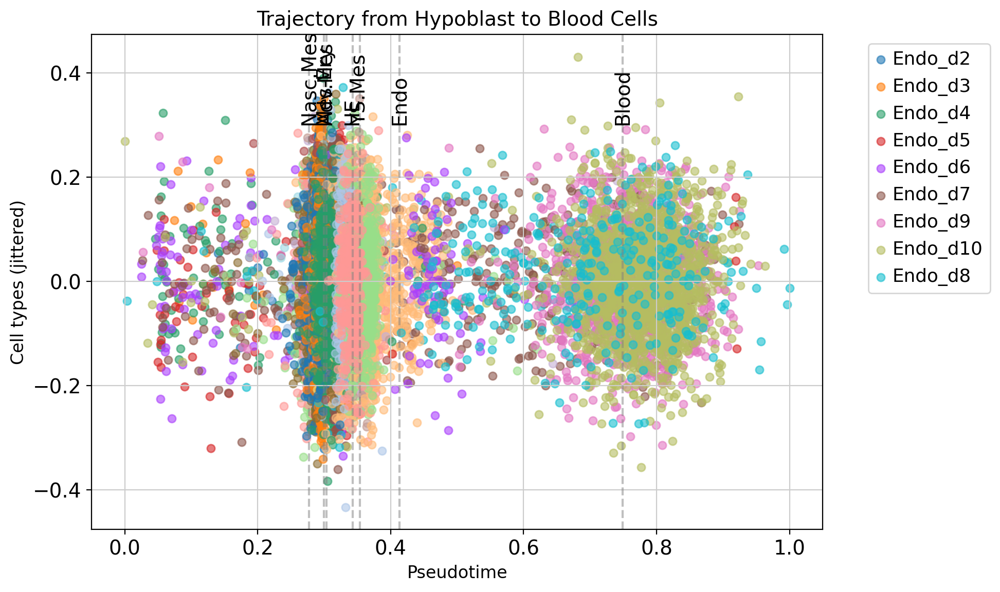


9. Saving results...

Analysis complete!

Key outputs saved:
- hypoblast_blood_trajectory_annotated.h5ad: Annotated AnnData object
- hypoblast_blood_trajectory_pseudotime.csv: Pseudotime values per cell
- hypoblast_blood_trajectory_gene_correlations.csv: Gene-pseudotime correlations
- hypoblast_blood_trajectory_summary.txt: Analysis summary


In [7]:
adata_subset, results = run_blood_trajectory_analysis(adata)

### HCEB D4

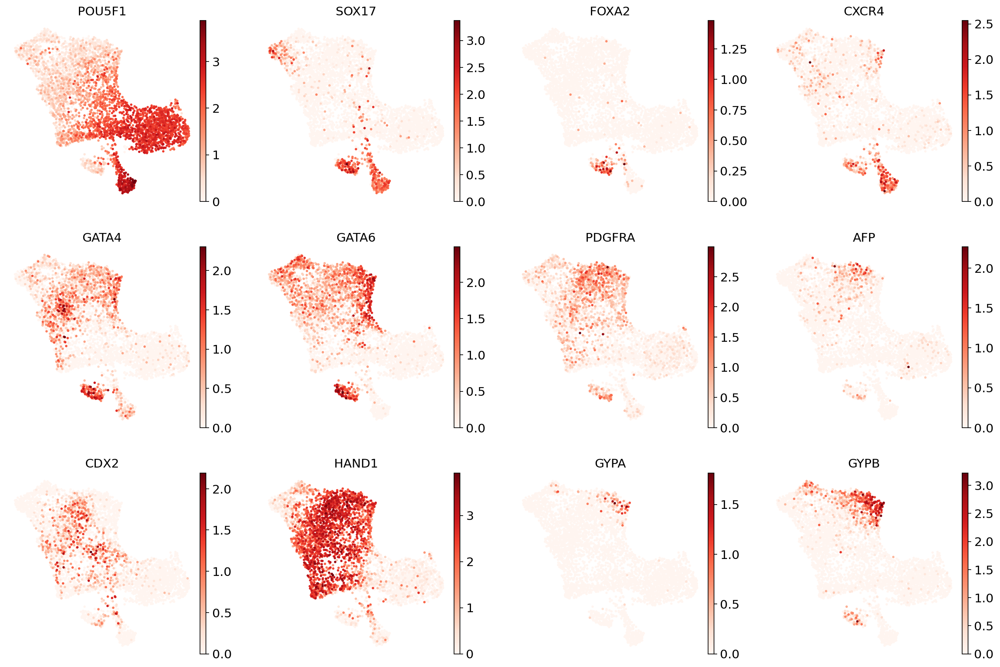

In [ ]:
sc.pl.umap(adata_d4, color=['POU5F1', 'SOX17', 'FOXA2', 'CXCR4', 
     'GATA4', 'GATA6', 'PDGFRA', 
     'AFP', 'CDX2', 'HAND1',
     'GYPA', 'GYPB'], size=30, frameon=False)

In [ ]:
marker_genes = {
    'Adv.Mes': ['HAND1', 'FOXF1', 'SNAI1'],
    'Blood': ['HBZ', 'HBE1', 'GYPA'],
    'Ect': ['TFAP2A', 'ISL1', 'CDH1'],
    'Endo': ['SOX17', 'FOXA2', 'GATA4'],    
    'Epi': ['POU5F1', 'NANOG', 'SOX2',],
    'HE': ['CD34', 'PECAM1', 'KDR'],
    'Mes': ['VIM', 'COL1A1', 'PDGFRA'],
    'Nasc.Mes': ['MESP1', 'TBX6', 'FOXC1'],
    'PGC': ['PRDM1', 'TFAP2C', 'NANOS3'],
    'TE': ['GATA2', 'KRT7', 'CGA'],
    'YS.Mes': ['VTN', 'H19', 'IGF2']
}
sc.pl.dotplot(
    adata,
    marker_genes,
    groupby='CellType_man',
    dendrogram=False,  
    cmap='Reds',
    var_group_rotation=30,
    standard_scale='var',
    swap_axes=False,
    figsize=(12, 3), 
    show=False
)
plt.tight_layout()
plt.savefig(f'/mnt/yiming/nfs_share/hema_wave/2512-revision/4_hemo4_dotplot_CellType_man_markerexpression-short.svg', 
                format='svg', dpi=300, bbox_inches='tight')
plt.show()
plt.close()

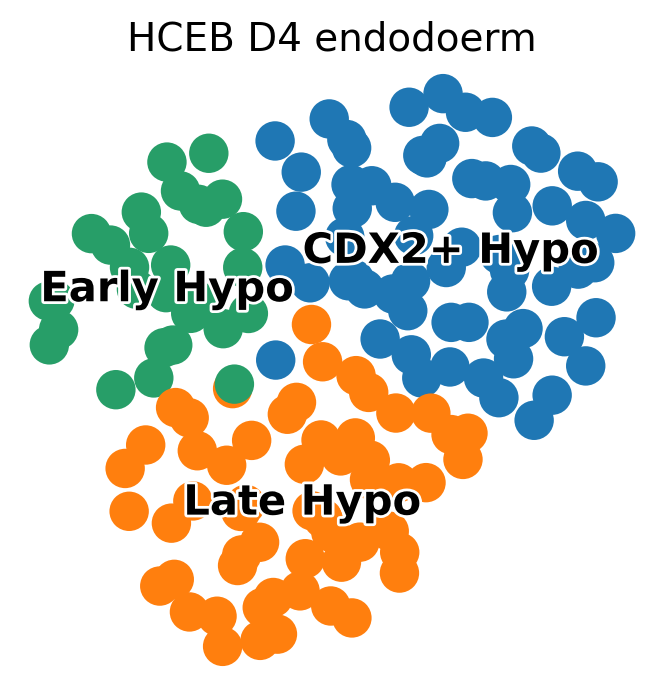

In [14]:
sc.pl.umap(adata_d4_endo, color=['subcluster_man'], title='HCEB D4 endodoerm', 
          frameon=False, legend_loc='on data', legend_fontsize=15, legend_fontoutline=2)

In [22]:
sc.pl.dotplot(
    adata_d4_endo,
    # {'Hypo': ['POU5F1', 'SOX17', 'GATA4', 'GATA6', 'PDGFRA'],
    #  'YS.Mes': ['AFP', 'APOA1'],
    #  # 'ExMC': ['CDX2', 'HAND1', 'GATA3', 'GATA2', 'TEAD4', 'VIM'],
    #  'Ery': ['HBZ', 'HBE1', 'GYPA', 'GYPB']},
    ['POU5F1', 'SOX17', 'FOXA2', 'CXCR4', 
     'GATA4', 'GATA6', 'PDGFRA', 
     'AFP', 'APOA1', 'CDX2', 'HAND1', 
     'HBZ', 'HBE1', 'GYPA', 'GYPB'],
    groupby='subcluster_man',
    dendrogram=False,  
    cmap='Reds',
    # var_group_rotation=90,
    standard_scale='var',
    swap_axes=True,
    figsize=(3, 5), 
    # title='HCBE Endoderm subtypes marker gene expression',
    show=False
)
plt.savefig(f'/mnt/yiming/nfs_share/hema_wave/2512-revision/3_hemo4_dotplot_endo_geneexp.svg', 
                format='svg', dpi=300, bbox_inches='tight')
plt.close()

In [24]:
sc.pl.umap(adata_d4_endo, color=['subcluster_man'], 
           legend_loc='on data', legend_fontsize=15, legend_fontoutline=2, 
           title='HCEB D4 Endo Subtype',
          frameon=False, show=False)
plt.savefig(f'/mnt/yiming/nfs_share/hema_wave/2512-revision/3_hemo4_umap_endo_subtype_legendon.svg', 
                format='svg', dpi=300, bbox_inches='tight')
plt.close()

In [36]:
emt_genes = ['EGF', 'EGFR', 'STAT3', 'MAPK1', 
             'TGFB1', 'TGFBR1', 'TNF', 'TNFRSF1A', 
            'NFKB1', 'ZEB1', 'ZEB2', 'TWIST1', 'SNAI1', 'SNAI2', 
            'PRRX1', 'FOXC2', 'SOX4', 'SOX9', 
            'VIM', 'CDH2', 'FN1', 'MMP2', 'MMP9', 'LOX', 'TGM2']
sc.tl.score_genes(adata, emt_genes, score_name='EMT')

wnt_genes = ['WNT1', 'WNT2', 'WNT3', 'WNT3A', 'WNT4', 'WNT5A', 'WNT7A', 'WNT8A', 'WNT11',  
             'FZD1', 'FZD2', 'FZD3', 'FZD4', 'FZD5', 'FZD6', 'FZD7', 'FZD8', 'FZD9', 'FZD10',  
             'LRP5', 'LRP6', 'DVL1', 'DVL2', 'DVL3',  
             'AXIN1', 'AXIN2', 'APC', 'GSK3B', 'CTNNB1', 'TCF7', 'TCF7L1', 'TCF7L2', 'LEF1'] 
sc.tl.score_genes(adata, wnt_genes, score_name='WNT')

hedgehog_genes = ['SHH', 'IHH', 'DHH',  
                 'PTCH1', 'PTCH2', 'SMO',  
                 'GLI1', 'GLI2', 'GLI3',  
                 'SUFU', 'HHIP']  
sc.tl.score_genes(adata, hedgehog_genes, score_name='hedgehog')

tgf_bmp_genes = ['TGFB1', 'TGFB2', 'TGFB3',  
                'BMP2', 'BMP4', 'BMP7', 'BMP9',  
                'SMAD1', 'SMAD2', 'SMAD3', 'SMAD4', 'SMAD5', 'SMAD9',  
                'TGFBR1', 'TGFBR2', 'BMPR1A', 'BMPR1B', 'BMPR2',  
                'NOG', 'CHRD', 'GREM1', 'FST']  
sc.tl.score_genes(adata, tgf_bmp_genes, score_name='TGF/BMP')

notch_genes = ['NOTCH1', 'NOTCH2', 'NOTCH3', 'NOTCH4',  
              'DLL1', 'DLL3', 'DLL4', 'JAG1', 'JAG2',  
              'RBPJ', 'HES1', 'HES5', 'HEY1', 'HEY2']  
sc.tl.score_genes(adata, notch_genes, score_name='NOTCH')

fgf_genes = ['FGF1', 'FGF2', 'FGF4', 'FGF8', 'FGF10',  
            'FGFR1', 'FGFR2', 'FGFR3', 'FGFR4',  
            'GRB2', 'SOS1', 'RAS', 'RAF1', 'MAPK1', 'MAPK3']  
sc.tl.score_genes(adata, fgf_genes, score_name='FGF')

retinoic_acid_genes = ['RARA', 'RARB', 'RARG',  
                      'RXRA', 'RXRB', 'RXRG',  
                      'CYP26A1', 'CYP26B1', 'CYP26C1',  
                      'ALDH1A1', 'ALDH1A2', 'ALDH1A3']  
sc.tl.score_genes(adata, retinoic_acid_genes, score_name='RA')

nodal_genes = ['NODAL', 'LEFTY1', 'LEFTY2',  
              'ACVR1B', 'ACVR2A', 'ACVR2B',  
              'SMAD2', 'SMAD3', 'SMAD4',  
              'PITX2', 'FOXH1']  
sc.tl.score_genes(adata, nodal_genes, score_name='NODAL')

jak_stat_genes = ['JAK1', 'JAK2', 'JAK3', 'TYK2',  
                 'STAT1', 'STAT2', 'STAT3', 'STAT4', 'STAT5A', 'STAT5B', 'STAT6',  
                 'IL6ST', 'SOCS1', 'SOCS3', 'PIAS1']  
sc.tl.score_genes(adata, jak_stat_genes, score_name='JAK/STAT')

computing score 'EMT'
    finished: added
    'EMT', score of gene set (adata.obs).
    350 total control genes are used. (0:00:00)
computing score 'WNT'
    finished: added
    'WNT', score of gene set (adata.obs).
    449 total control genes are used. (0:00:00)
computing score 'hedgehog'
    finished: added
    'hedgehog', score of gene set (adata.obs).
    300 total control genes are used. (0:00:00)
computing score 'TGF/BMP'
    finished: added
    'TGF/BMP', score of gene set (adata.obs).
    400 total control genes are used. (0:00:00)
computing score 'NOTCH'
    finished: added
    'NOTCH', score of gene set (adata.obs).
    450 total control genes are used. (0:00:00)
computing score 'FGF'
    finished: added
    'FGF', score of gene set (adata.obs).
    349 total control genes are used. (0:00:00)
computing score 'RA'
    finished: added
    'RA', score of gene set (adata.obs).
    300 total control genes are used. (0:00:00)
computing score 'NODAL'
    finished: added
    'NODAL',

In [ ]:
scores = ['EMT', 'WNT', 'hedgehog', 'TGF/BMP', 'NOTCH', 'FGF', 'RA', 'JAK/STAT']
sc.pl.dotplot(adata_blood, groupby=['CellType_man'], var_names=scores, standard_scale='var')
plt.savefig(f'/mnt/yiming/nfs_share/hema_wave/2512-revision/3_hemo4_dotplot_celltype_pathwayscore.svg', 
                format='svg', dpi=300, bbox_inches='tight')
plt.show()
plt.close()

In [ ]:
sc.pl.dotplot(adata, groupby=['CellType_man'], var_names=['EGF', 'EGFR', 'STAT3', 'MAPK1', 
             'TGFB1', 'TGFBR1', 'TNF', 'TNFRSF1A', 
            'NFKB1', 'ZEB1', 'ZEB2', 'TWIST1', 'SNAI1', 'SNAI2', 
            'PRRX1', 'FOXC2', 'SOX4', 'SOX9', 
            'VIM', 'CDH2', 'FN1', 'MMP2', 'MMP9', 'LOX', 'TGM2'], 
    dendrogram=False,  
    cmap='Reds',
    var_group_rotation=0,
    standard_scale='var',
    swap_axes=False,
    figsize=(9, 2.5))
plt.savefig(f'/mnt/yiming/nfs_share/hema_wave/2512-revision/3_hemo4_dotplot_emt.svg', 
                format='svg', dpi=300, bbox_inches='tight')
plt.close()

### HCEB D7

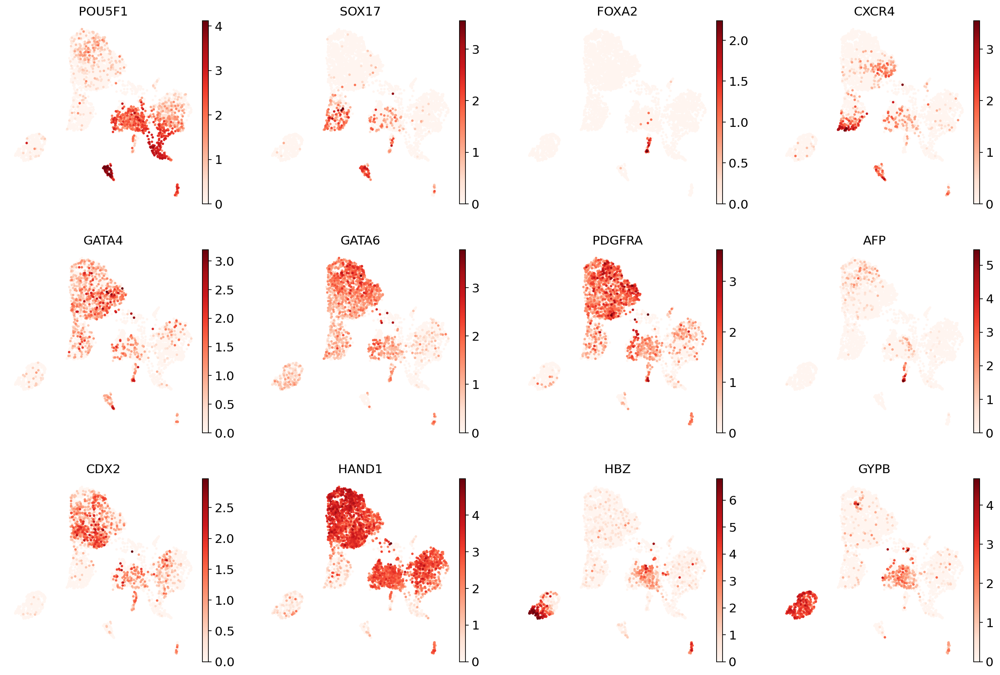

In [3]:
sc.pl.umap(adata_d7, color=['POU5F1', 'SOX17', 'FOXA2', 'CXCR4', 
     'GATA4', 'GATA6', 'PDGFRA', 
     'AFP', 'CDX2', 'HAND1',
     'HBZ', 'GYPB'], size=30, frameon=False)

{'mainplot_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

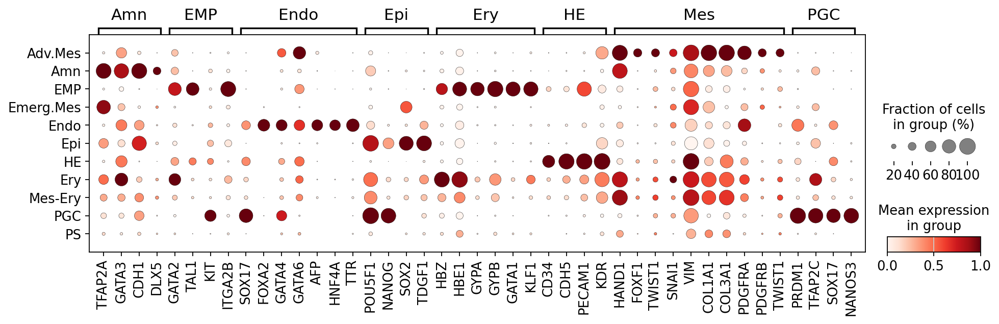

In [15]:
marker_genes = {
    'Amn': ['TFAP2A', 'GATA3', 'CDH1', 'DLX5'],
    'EMP': ['GATA2', 'TAL1', 'KIT', 'ITGA2B'],
    'Endo': ['SOX17', 'FOXA2', 'GATA4', 'GATA6', 'AFP', 'HNF4A', 'TTR'],    
    'Epi': ['POU5F1', 'NANOG', 'SOX2', 'TDGF1'],
    'Ery': ['HBZ', 'HBE1', 'GYPA', 'GYPB', 'GATA1', 'KLF1'],
    'HE': ['CD34', 'CDH5', 'PECAM1', 'KDR'],
    'Mes': ['HAND1', 'FOXF1', 'TWIST1', 'SNAI1', 'VIM', 'COL1A1', 'COL3A1', 'PDGFRA', 'PDGFRB', 'TWIST1'],
    'PGC': ['PRDM1', 'TFAP2C', 'SOX17', 'NANOS3'],
}

# Create dot plot with custom order
sc.pl.dotplot(
    adata_d7,
    marker_genes,
    groupby='celltype_work',
    dendrogram=False,  
    cmap='Reds',
    var_group_rotation=0,
    standard_scale='var',
    swap_axes=False,
    figsize=(14, 3.5), 
    show=False
)

### HCEB D12

<Axes: title={'center': 'Cell Type'}, xlabel='UMAP1', ylabel='UMAP2'>

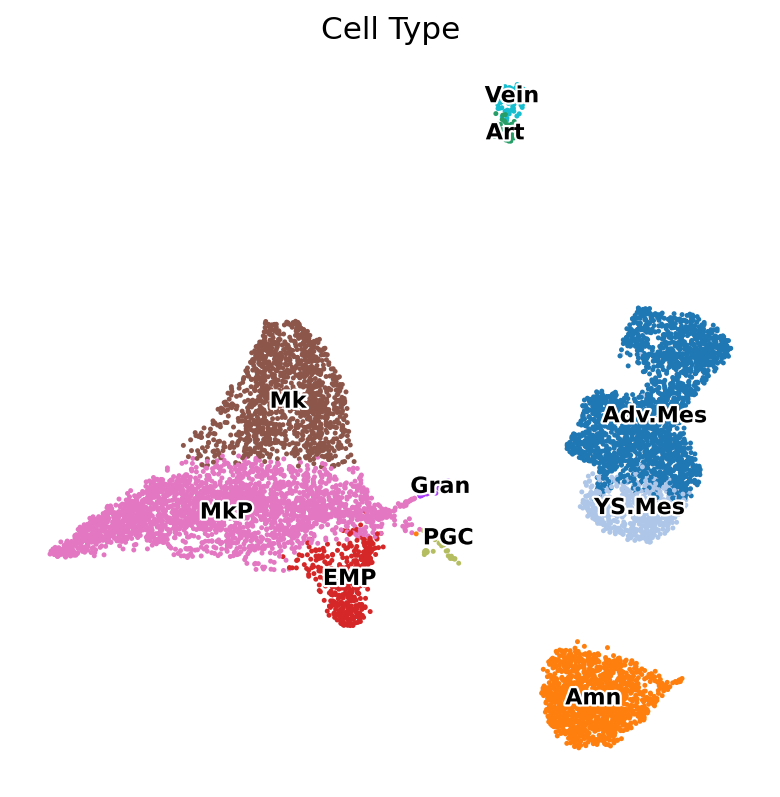

In [3]:
sc.pl.umap(adata, color=['CellType_man'], frameon=False, legend_loc='on data', 
           legend_fontsize=10, legend_fontoutline=2, title='Cell Type', 
           size=20, show=False)

[<Axes: title={'center': 'SOX17'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'FOXA2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'PDGFRA'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'GATA4'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'GATA6'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'CDX2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'HBZ'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'GYPB'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'NANOS3'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'HAND1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'HAND2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'MESP1'}, xlabel='UMAP1', ylabel='UMAP2'>]

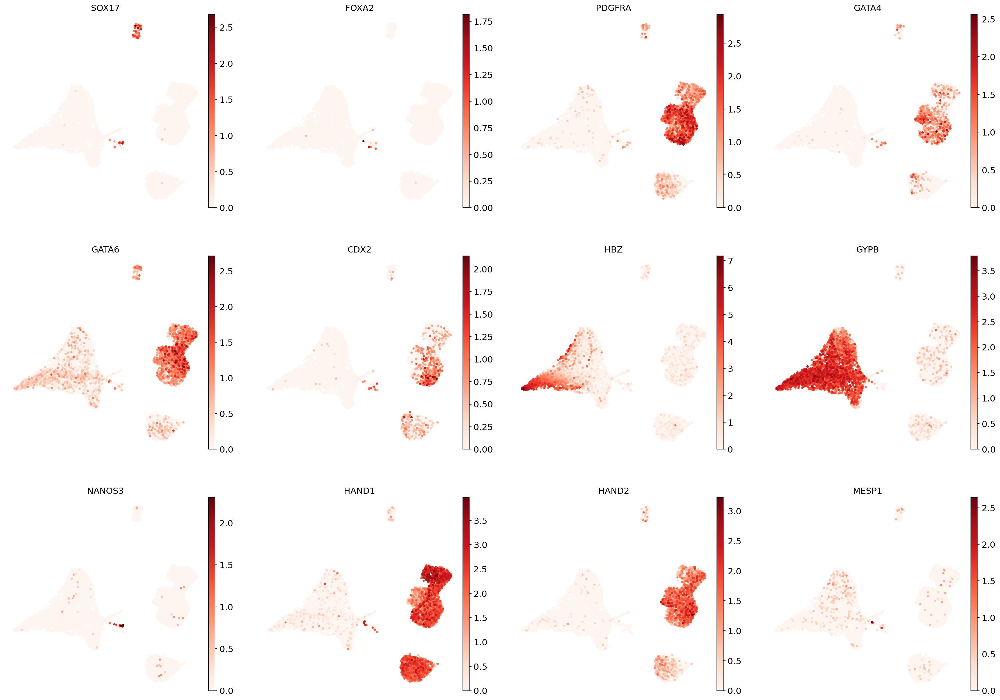

In [8]:
sc.pl.umap(adata, color=['SOX17', 'FOXA2', 'PDGFRA', 'GATA4', 'GATA6', 
                         'CDX2', 'HBZ', 'GYPB', 'NANOS3', 'HAND1', 'HAND2', 'MESP1'], frameon=False, size=50, show=False)

### HCEB D1-24

<Axes: title={'center': 'HCEB D1-24'}, xlabel='UMAP1', ylabel='UMAP2'>

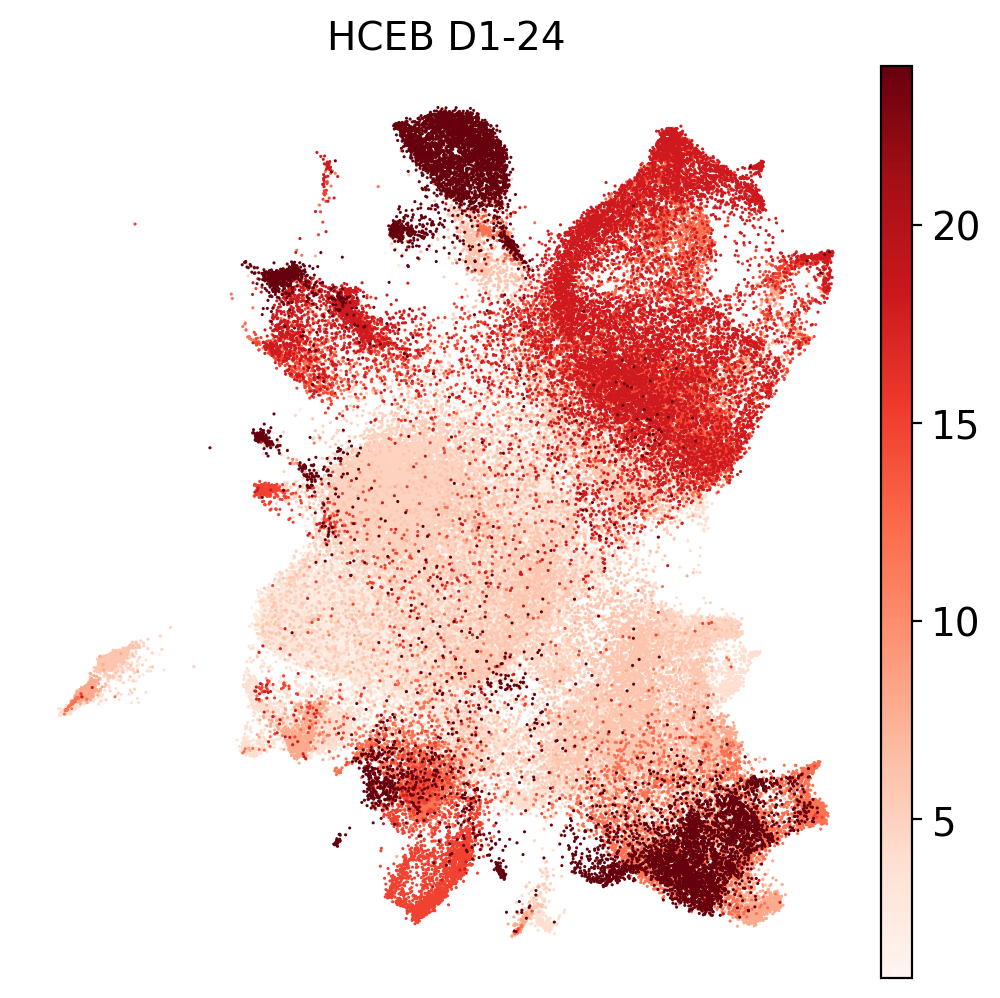

In [23]:
sc.pl.umap(adata_24, color=['day'], 
           # legend_loc='on data', legend_fontsize=10, legend_fontoutline=2, 
           title='HCEB D1-24', size=5, 
          frameon=False, show=False)

/mnt/yiming/nfs_share/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


<Axes: title={'center': 'HCEB D1-24'}, xlabel='UMAP1', ylabel='UMAP2'>

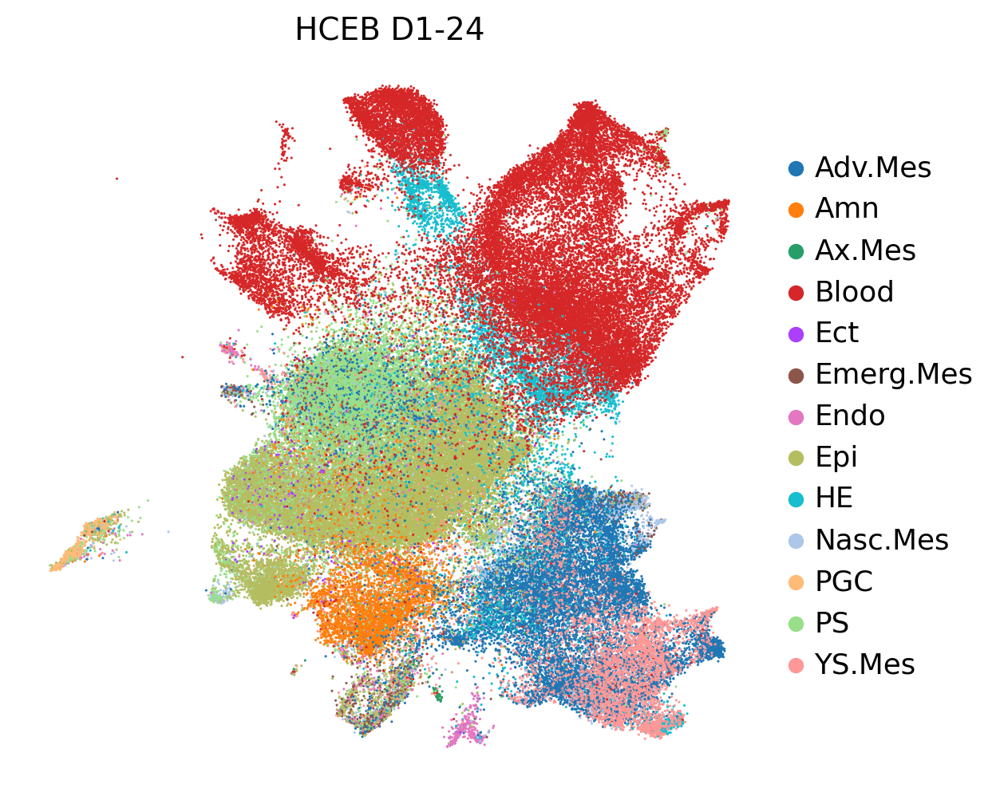

In [24]:
sc.pl.umap(adata_24, color=['celltype_work'], 
           # legend_loc='on data', legend_fontsize=10, legend_fontoutline=2, 
           title='HCEB D1-24', size=5, 
          frameon=False, show=False)